<a href="https://colab.research.google.com/github/MikolajLangner/JobGraph/blob/main/Analiza_sieci.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Jakich narzędzi warto się nauczyć aby zostać Data Scientist?
### Analiza sieci wymganych narzędzi dla stanowiska Data Scientist

#### Instalacja oraz import bibliotek

In [1]:
!pip install networkx
!pip install python-louvain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
import networkx as nx
from community import community_louvain
from networkx.algorithms.community import asyn_lpa_communities
import networkx.algorithms.community as nx_comm
from IPython.display import display, Markdown
import scipy.stats as stats
import random
import matplotlib.colors as mcolors
import collections
from typing import Dict
from warnings import filterwarnings

filterwarnings('ignore')

#### Wczytanie danych

In [3]:
edges = pd.read_csv('edges.csv')

In [4]:
nodes = pd.read_csv('nodes.csv')

In [5]:
total_offers = nodes.loc[nodes['node'] == 'total', 'size'].iat[0]
nodes = nodes[nodes['node'] != 'total']

In [6]:
edges['weight_norm'] = edges['weight'] / np.sqrt(total_offers)

In [7]:
nodes['size_norm'] = nodes['size'] / total_offers

In [8]:
def bi_weight(row):

    deg_in = nodes.loc[nodes['node'] == row['source'], 'size'].iat[0]
    deg_out = nodes.loc[nodes['node'] == row['target'], 'size'].iat[0]
    weight = row['weight']

    return 2.0 if deg_out == weight else min(2.0, weight / (deg_in - weight))

bi_edges = edges.copy()
bi_edges.columns = bi_edges.columns[[1, 0, 2, 3]]
bi_edges = pd.concat((edges, bi_edges), ignore_index=True)
bi_edges['weight_norm'] = bi_edges.apply(bi_weight, axis=1)

In [9]:
G = nx.from_pandas_edgelist(edges, edge_attr=True)
G_bi = nx.from_pandas_edgelist(bi_edges, edge_attr=True, create_using=nx.DiGraph)

In [10]:
for graph in (G, G_bi):
    nx.set_node_attributes(graph, dict(zip(nodes['node'], nodes['size'])), name='size')
    nx.set_node_attributes(graph, dict(zip(nodes['node'], nodes['size_norm'])), name='size_norm')

#Wizualizacja sieci

In [29]:
def visualize_jobboard(G: nx.Graph, pos: Dict, opacity: float = .8, node_scale = 4000, edge_scale = 2) -> Figure:

    fig, ax = plt.subplots(figsize=(15, 8))
    degrees = dict(G.nodes(data='size_norm'))
    node_sizes = [v * node_scale for v in degrees.values()]
    
    edge_colors = [w for _, _, w in G.edges(data='weight_norm')]
    alphas = [w for _, _, w in G.edges(data='weight')]
    alphas = np.array(alphas) / max(alphas) * opacity
    
    if nx.is_directed(G):
        arcs = nx.draw_networkx_edges(G, pos, ax=ax, edge_color=edge_colors, alpha=alphas, edge_cmap=plt.cm.RdYlGn, edge_vmin=0, edge_vmax=2, width=edge_scale)
        sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlGn, norm=plt.Normalize(vmin = 0, vmax=2))
    else:
        arcs = nx.draw_networkx_edges(G, pos, ax=ax, edge_color=edge_colors, alpha=alphas, edge_cmap=plt.cm.plasma, edge_vmin=0, edge_vmax=1, width=edge_scale)
        sm = plt.cm.ScalarMappable(cmap=plt.cm.plasma, norm=plt.Normalize(vmin = 0, vmax=1))

    nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=opacity, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=node_scale / 500, ax=ax)
    sm._A = []
    plt.colorbar(sm)

    plt.tight_layout()
    return fig

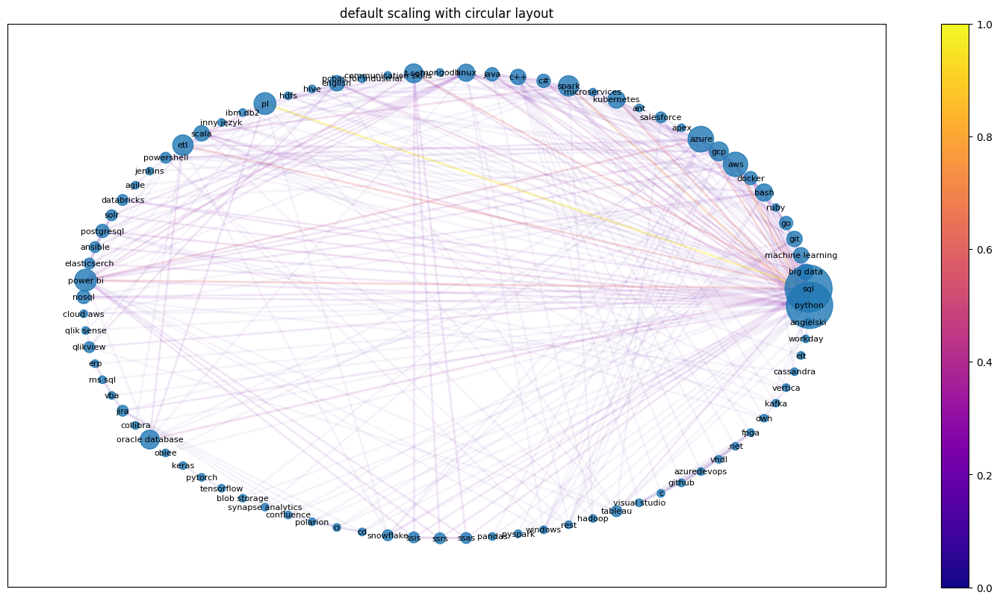

In [30]:
circ_lay = nx.circular_layout(G)
visualize_jobboard(G, circ_lay)
plt.title('default scaling with circular layout');

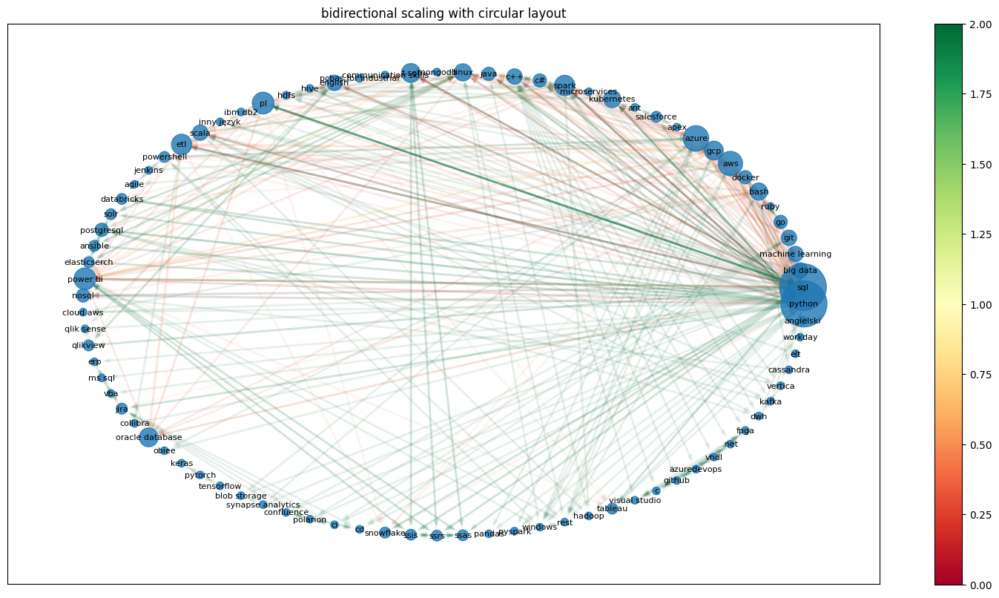

In [31]:
visualize_jobboard(G_bi, circ_lay)
plt.title('bidirectional scaling with circular layout');

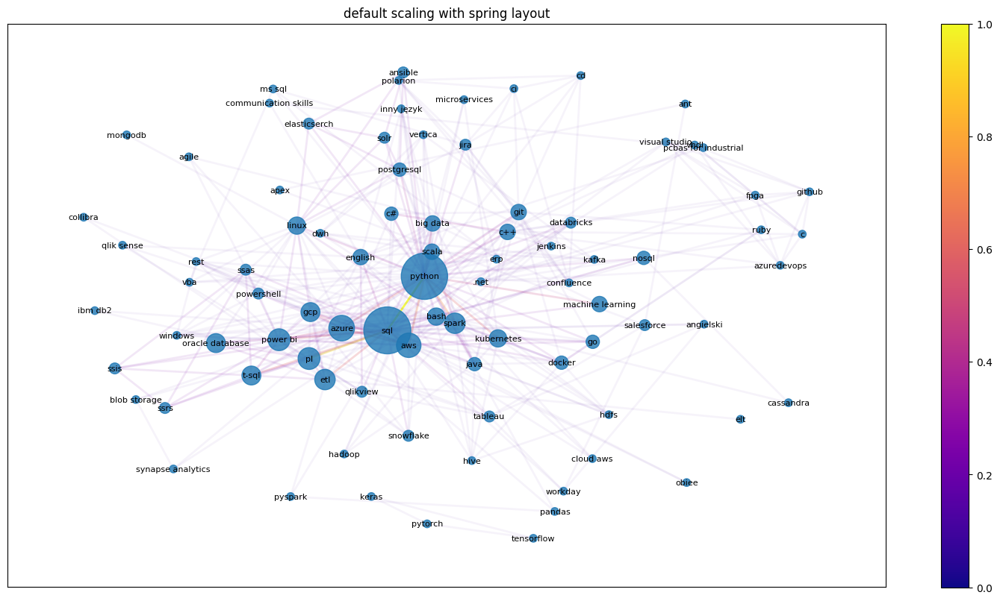

In [32]:
spr_lay = nx.spring_layout(G, k=0.9)
visualize_jobboard(G, spr_lay)
plt.title('default scaling with spring layout');

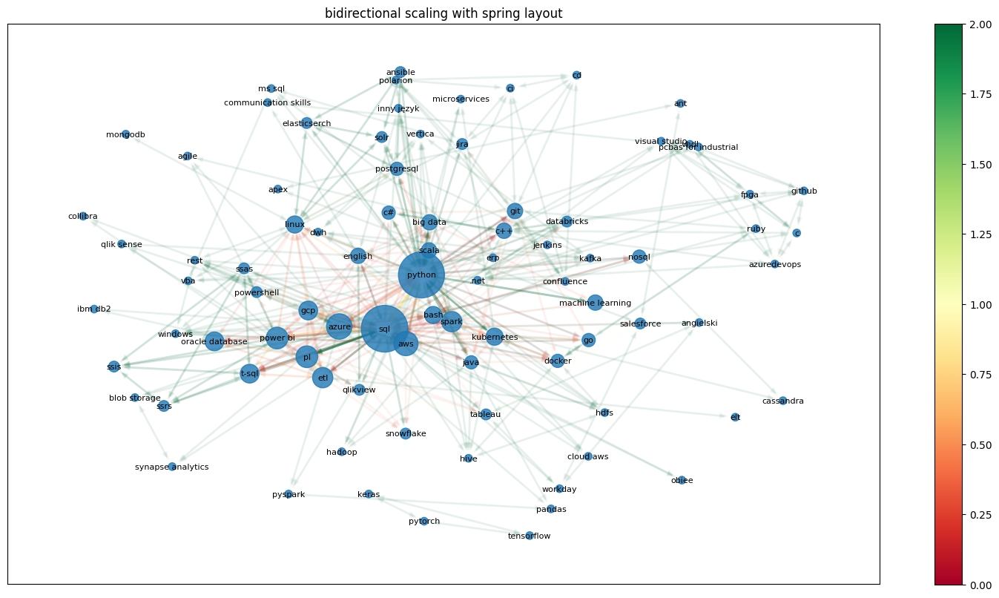

In [33]:
visualize_jobboard(G_bi, spr_lay)
plt.title('bidirectional scaling with spring layout');

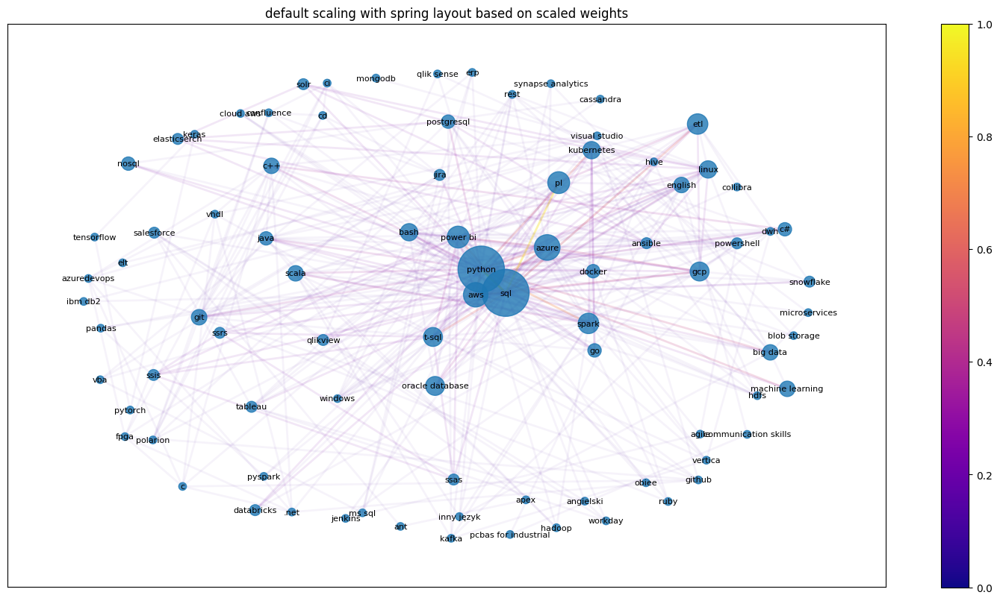

In [34]:
visualize_jobboard(G, nx.spring_layout(G, k=0.9, weight='weight_norm'))
plt.title('default scaling with spring layout based on scaled weights');

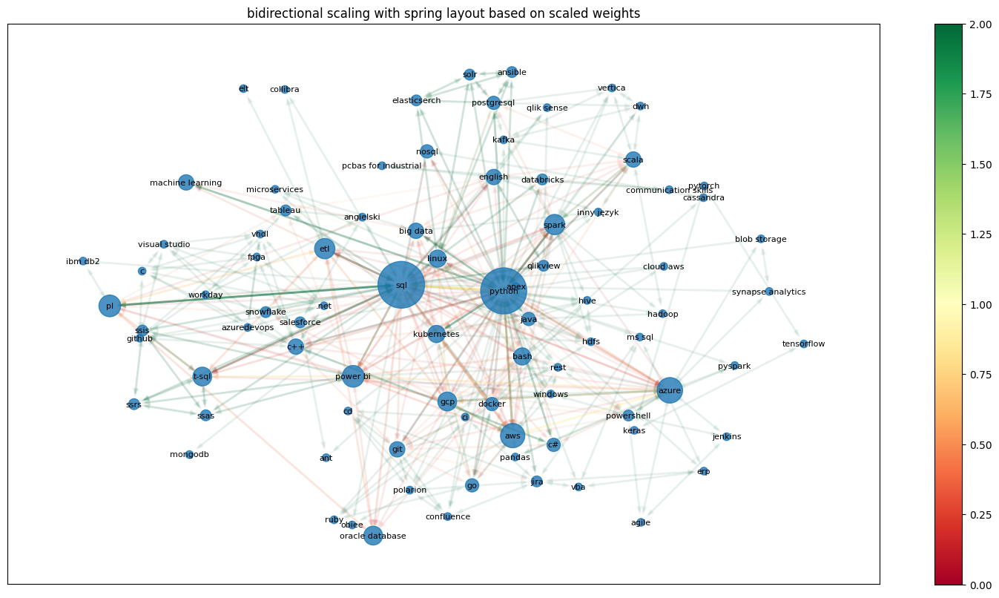

In [35]:
visualize_jobboard(G_bi, nx.spring_layout(G_bi, k=0.9, weight='weight_norm'))
plt.title('bidirectional scaling with spring layout based on scaled weights');

## Analiza sieci

### Liczba krawędzi i wierzchołków

In [36]:
display(Markdown(f"## Ilość wierzchołków = {G.number_of_nodes()}"))
display(Markdown(f"## Ilość krawędzi = {G.number_of_edges()}"))

## Ilość wierzchołków = 87

## Ilość krawędzi = 342

### Rozkład stopni węzłów

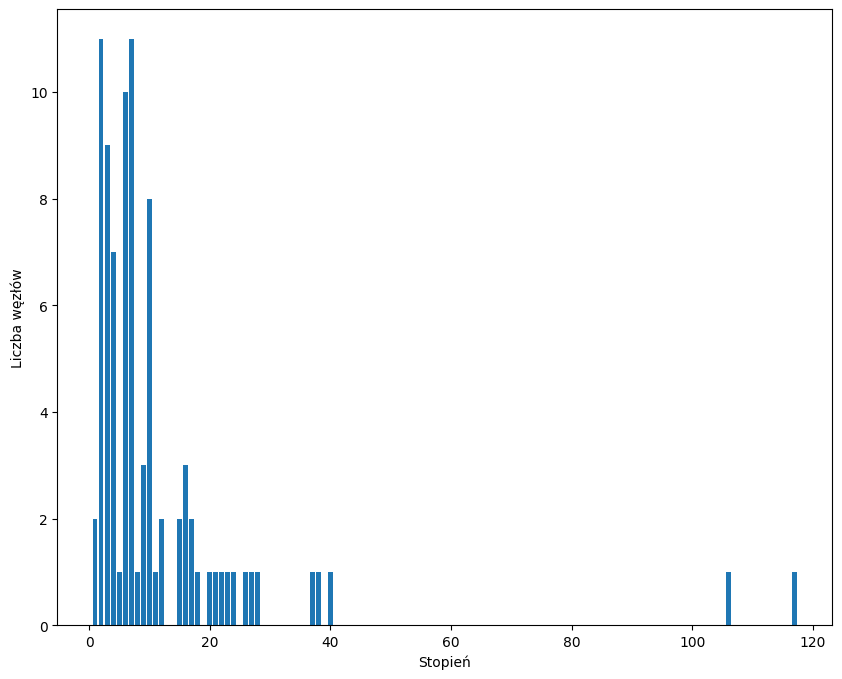

In [37]:
degrees = [val for node, val in G.degree(weight='weight')]
degrees_lvl = collections.Counter(degrees)
degrees, counter = zip(*degrees_lvl.items())
fig, ax = plt.subplots(figsize=(10,8))
ax.bar(degrees, counter)
ax.set_xlabel("Stopień")
ax.set_ylabel("Liczba węzłów")
plt.show()

### Liczba komponentów

In [38]:
components = nx.connected_components(G)
display(Markdown(f"## Liczba komponentów = {len(list(components))}"))

## Liczba komponentów = 2

In [39]:
list(nx.connected_components(G))[1]

{'keras', 'pytorch', 'tensorflow'}

In [40]:
G_ = G.subgraph(list(nx.connected_components(G))[1])
G = G.subgraph(next(nx.connected_components(G)))

### Średnica sieci

In [41]:
diameter = nx.diameter(G)
display(Markdown(f"## Średnica = {diameter}"))

## Średnica = 4

### Średnia długość ścieżki w grafie + rozkład

## Średnia długość ścieżki w grafie = 2.323293172690763

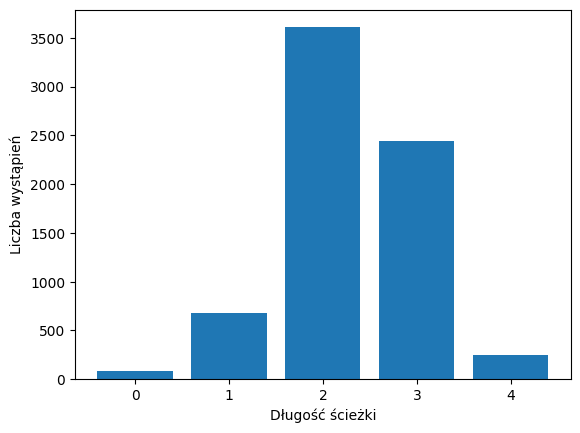

In [42]:
pos = nx.spring_layout(G)

avg_shortest_path_length = nx.average_shortest_path_length(G)
display(Markdown(f"## Średnia długość ścieżki w grafie = {avg_shortest_path_length}"))

shortest_path_lengths = []
for source, distances in nx.all_pairs_shortest_path_length(G):
    shortest_path_lengths.extend(list(distances.values()))

plt.hist(shortest_path_lengths, bins=range(max(shortest_path_lengths)+2), align='left', rwidth=0.8)
plt.xlabel('Długość ścieżki')
plt.ylabel('Liczba wystąpień')
plt.show()

### Przewodnictwo (Betweenness centrality) + rozkład

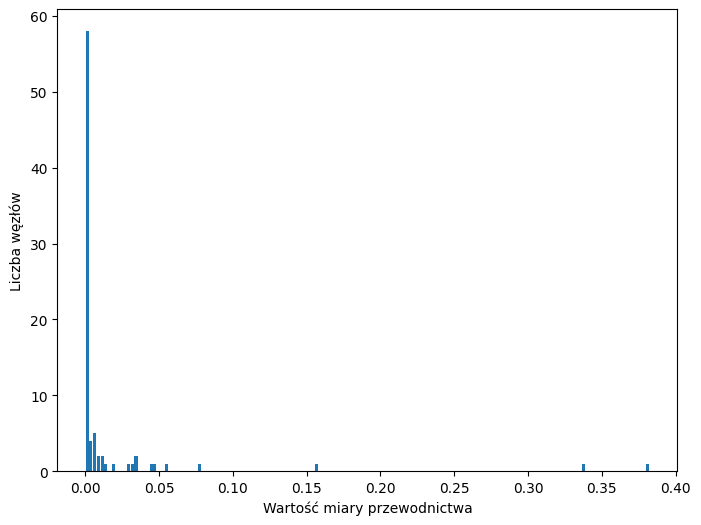

In [43]:
betweenness = nx.betweenness_centrality(G)
betweenness_values = list(betweenness.values())
fig, ax = plt.subplots(figsize=(8,6))
ax.hist(betweenness_values, bins='auto',rwidth=0.8)
ax.set_xlabel("Wartość miary przewodnictwa")
ax.set_ylabel("Liczba węzłów")
plt.show()

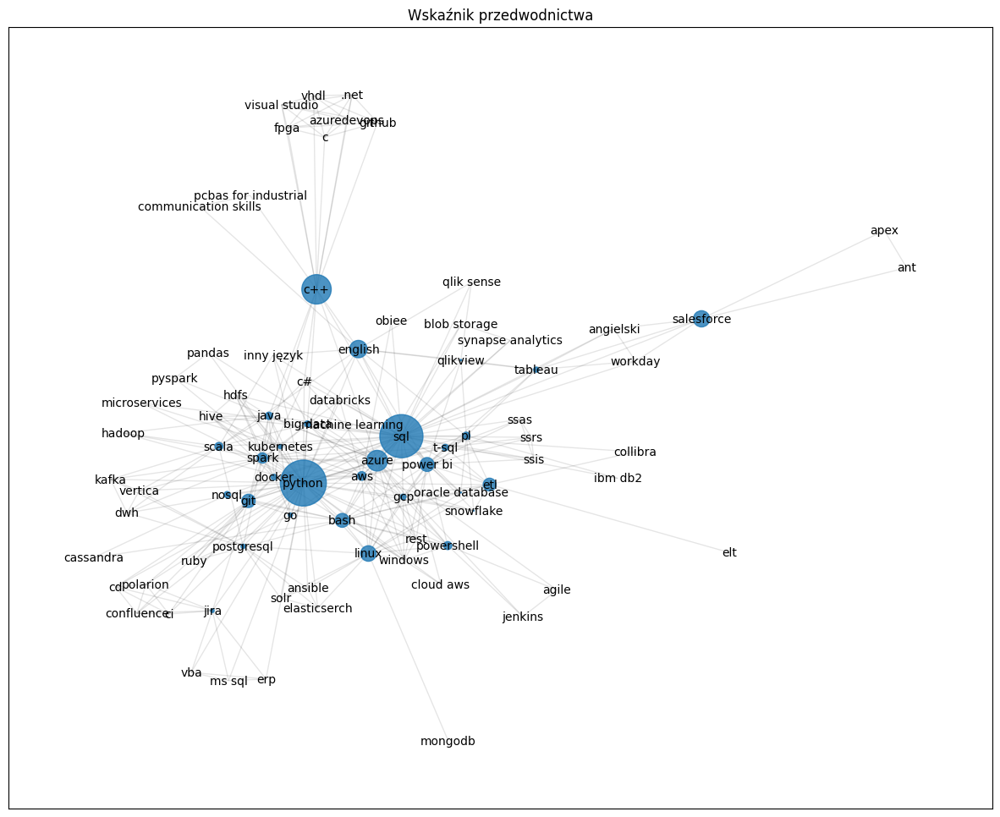

In [47]:
plt.figure(figsize=(15, 12))
nx.draw_networkx_nodes(G, pos, node_size=[v * 4000 for v in betweenness.values()], alpha=.8)
nx.draw_networkx_edges(G, pos, alpha=0.1)
nx.draw_networkx_labels(G, pos, labels={node: str(node) for node in G.nodes()}, font_size=10, font_color='black')
plt.title('Wskaźnik przedwodnictwa')
plt.show()

### Bliskość (closeness centrality)

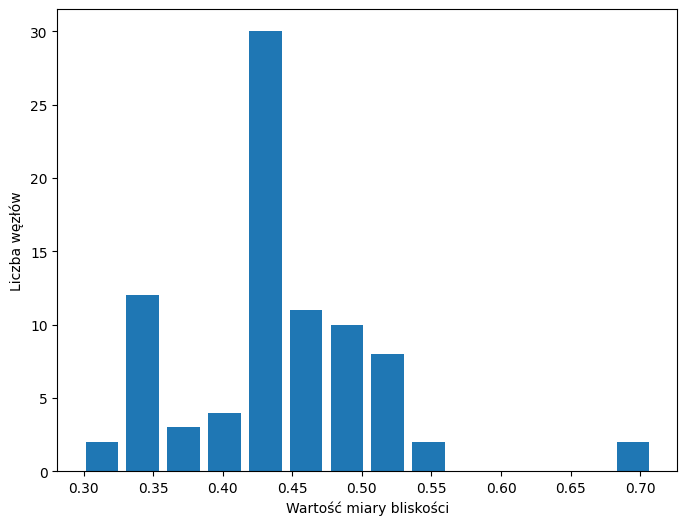

In [48]:
closeness = nx.closeness_centrality(G)
closeness_values = list(closeness.values())
fig, ax = plt.subplots(figsize=(8,6))
ax.hist(closeness_values, bins='auto', rwidth=0.8)
ax.set_xlabel("Wartość miary bliskości")
ax.set_ylabel("Liczba węzłów")
plt.show()

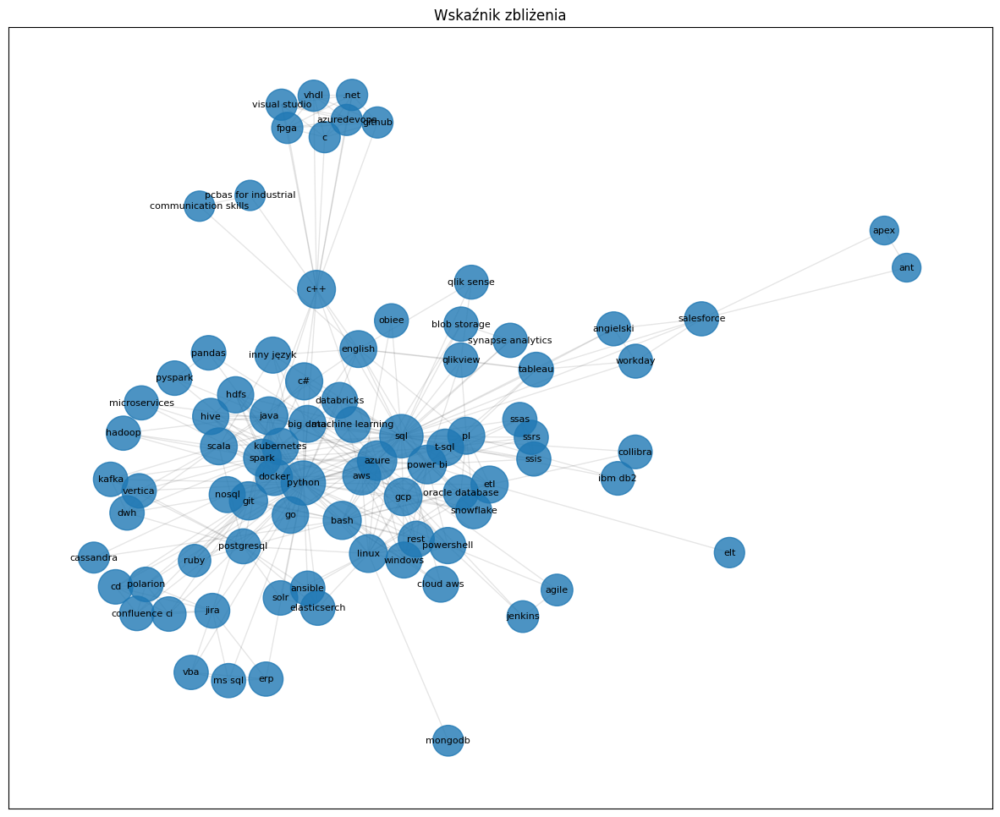

In [50]:
plt.figure(figsize=(15, 12))
nx.draw_networkx_nodes(G, pos, node_size=[v * 2000 for v in closeness.values()], alpha=.8)
nx.draw_networkx_edges(G, pos, alpha=0.1)
nx.draw_networkx_labels(G, pos, labels={node: str(node) for node in G.nodes()}, font_size=8, font_color='black')
plt.title('Wskaźnik zbliżenia')
plt.show()

## Średni współczynnik grupowania (Clustering coefficient) + rozkład

## Średni współczynnik grupowania wierzchołków w grafie = 0.807951354198893

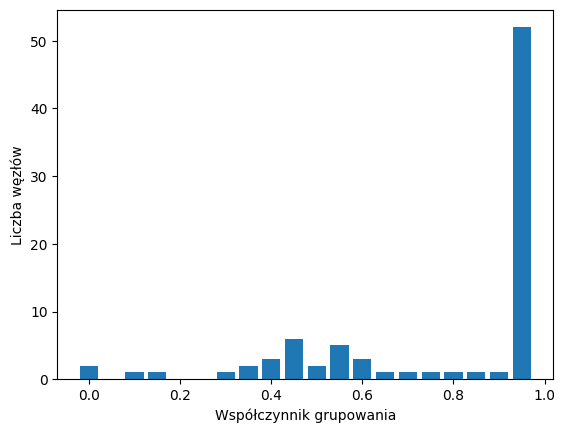

In [51]:
avg_clustering = nx.average_clustering(G)
display(Markdown(f"## Średni współczynnik grupowania wierzchołków w grafie = {avg_clustering}"))

clustering_coefficients = list(nx.clustering(G).values())

plt.hist(clustering_coefficients, bins=20, align='left', rwidth=0.8)
plt.xlabel('Współczynnik grupowania')
plt.ylabel('Liczba węzłów')
plt.show()

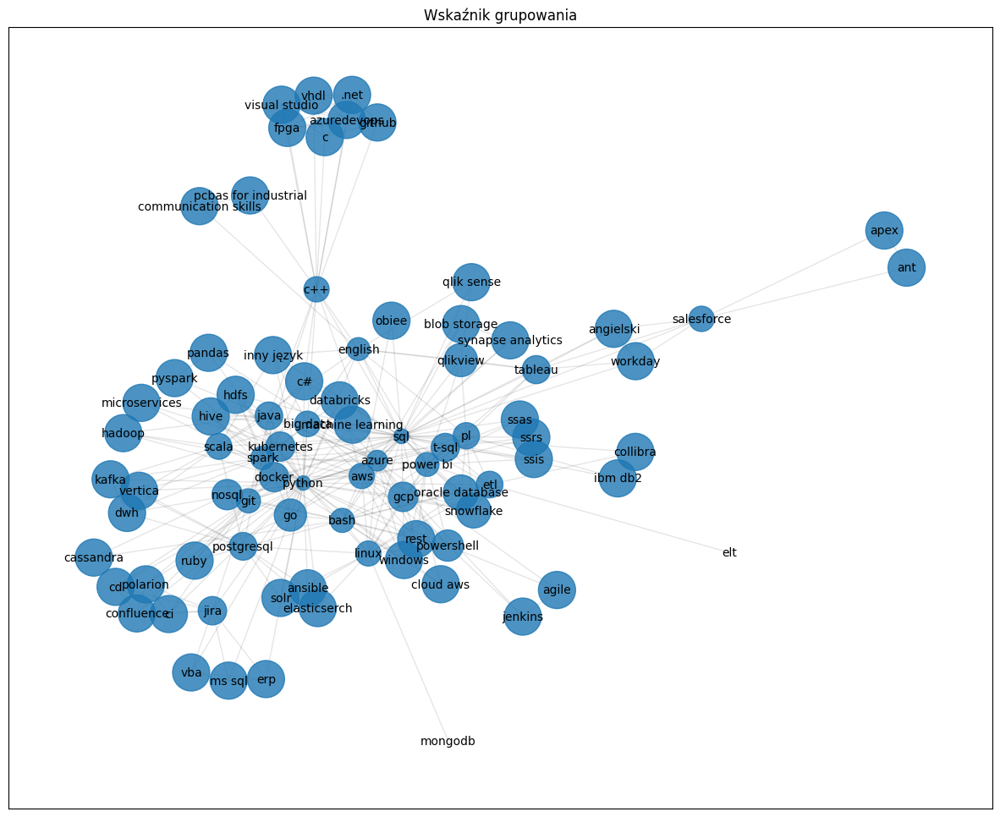

In [53]:
clustering_coefficients = nx.clustering(G)

node_sizes = [v * 1000 for v in clustering_coefficients.values()]
node_colors = list(clustering_coefficients.values())
plt.figure(figsize=(15, 12))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=.8)
nx.draw_networkx_edges(G, pos, alpha=0.1)
nx.draw_networkx_labels(G, pos, labels={node: str(node) for node in G.nodes()}, font_size=10, font_color='black')
plt.title('Wskaźnik grupowania')
plt.show()

## Znajdowanie grup - Louvain Method for Community Detection

## Ilość grup występujących w sieci = 6

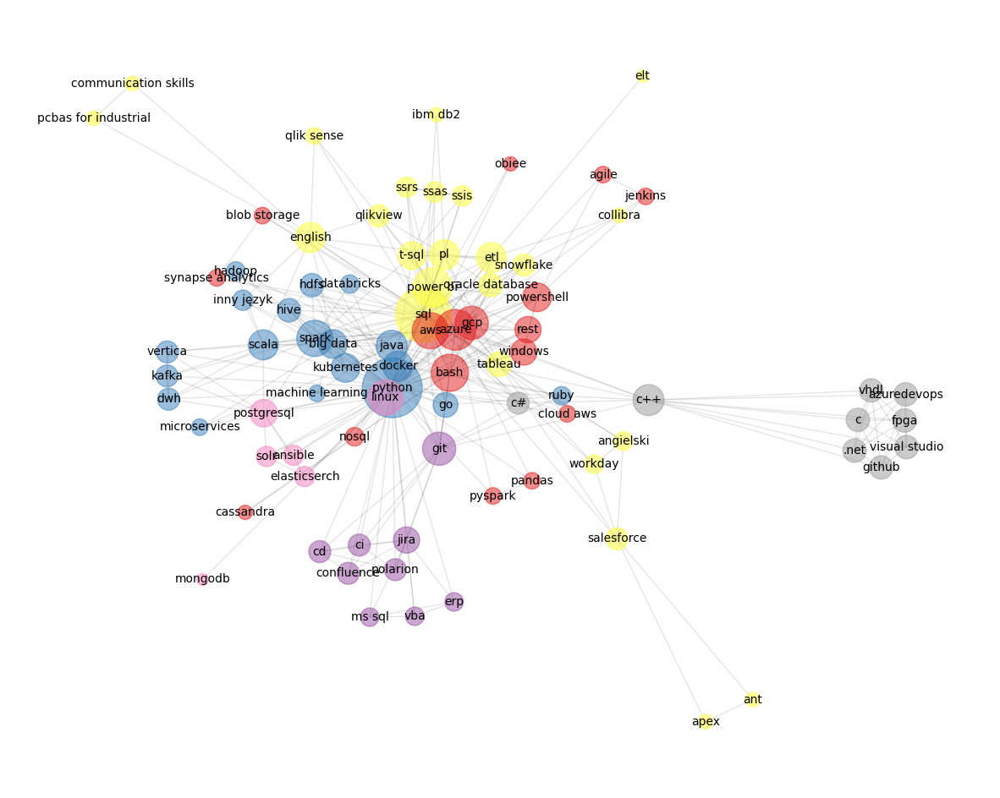

In [58]:
partition = community_louvain.best_partition(G)

display(Markdown(f"## Ilość grup występujących w sieci = {max(partition.values()) + 1}"))

degree_dict = dict(G.degree())
degree_list = [(degree_dict[node] + 1) * 50 for node in G.nodes()]

pos = nx.spring_layout(G)
plt.figure(figsize=(15, 12))
plt.axis('off')
nx.draw_networkx_nodes(G, pos, node_size=degree_list, cmap=plt.cm.Set1, node_color=list(partition.values()), alpha=.5)
nx.draw_networkx_edges(G, pos, alpha=0.1)
nx.draw_networkx_labels(G, pos, labels={node: str(node) for node in G.nodes()}, font_size=10, font_color='black')
plt.show()

## Wizulizacja grupy numer: 2

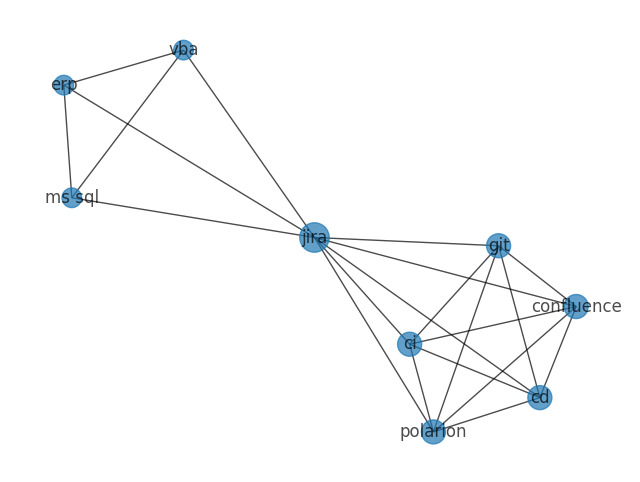

In [61]:
group_number = 2

display(Markdown(f"## Wizulizacja grupy numer: {group_number}"))

group_nodes = [node for node, group in partition.items() if group == group_number]
group_G = G.subgraph(group_nodes)

degree_dict = dict(group_G.degree())
degree_list = [(degree_dict[node] + 1) * 50 for node in group_G.nodes()]

pos = nx.spring_layout(group_G)
plt.figure(figsize=(8, 6))
plt.axis('off')
nx.draw_networkx(group_G, pos, node_size=degree_list, alpha=.7)
plt.show()

## Rozprzestrzenianie się informacji w sieci

In [64]:
from collections import defaultdict

start_node = 'python'
learnt = [start_node]
pos = nx.spring_layout(G)

display(Markdown(f"## Startowy wierzchołek = {start_node }"))

while len(learnt) < len(G):
    to_learn = defaultdict(lambda: 0)
    for _, to_tech, weight in G.edges(learnt, data='weight'):
        if to_tech not in learnt:
            to_learn[to_tech] += weight
    chosen = np.random.rand()
    stack_name = list(to_learn)
    weights = list(to_learn.values())
    all_w = sum(weights)
    sortid = np.argsort(weights)
    i = 0
    while chosen > 0:
        tech = stack_name[i]
        chosen -= weights[i] / all_w
        i += 1
    learnt.append(tech)

## Startowy wierzchołek = python

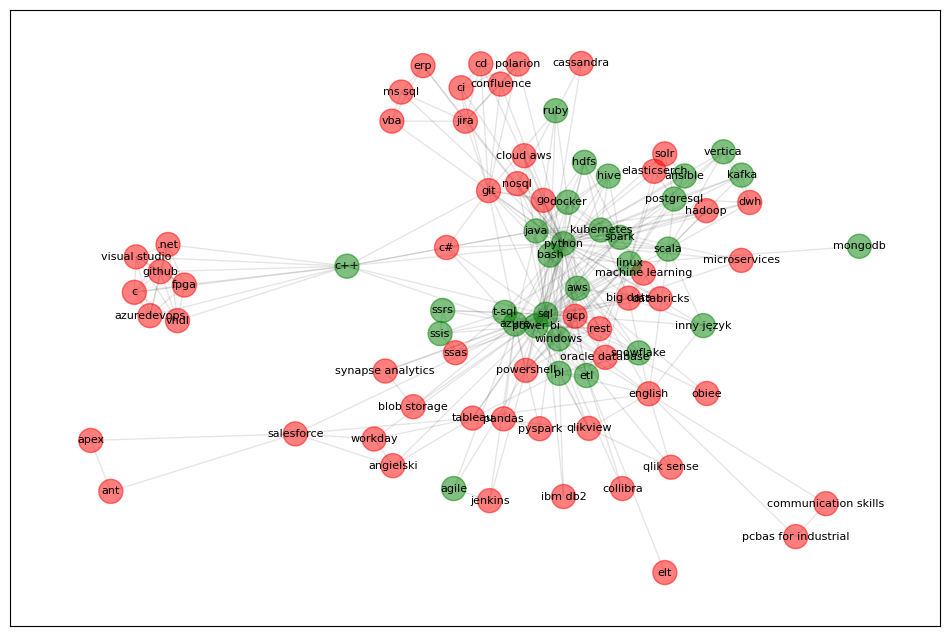

In [65]:
from matplotlib import animation
from matplotlib import rc
rc('animation', html='jshtml', embed_limit = 30)


nodes = list(G.nodes)
fig, ax = plt.subplots(figsize=(12, 8))
colors = ['r'] * len(nodes)


def animate(i):
    fig.clear()            
    colors[nodes.index(learnt[i])] = 'g'             
    nx.draw_networkx_nodes(G, pos=pos, node_color=colors, alpha=.5)
    nx.draw_networkx_edges(G, pos=pos, alpha=.1)
    nx.draw_networkx_labels(G, pos=pos, font_size=8)

anim = animation.FuncAnimation(fig, animate, frames=30,  interval=100, repeat=True)
anim